### Test [residual interpolation demosaic](http://www.ok.sc.e.titech.ac.jp/res/DM/TIP_RI.pdf) on [kodak](http://www.cs.albany.edu/~xypan/research/snr/Kodak.html) dataset, compare with simple interpolation

In [1]:
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib
import cv2
import numpy as np

In [2]:
import os
from PIL import Image

from mosaic_bayer import mosaic_bayer
from demosaic import demosaic
from simple_interpolation import simple_interpolation
from cpsnr import cpsnr


pattern = [1, 2, 0, 1]

cpsnrs_ri = []
cpsnrs_simple = []

img_samples = {"original": [], "ri": [], "simple": []}

for i, image_path in enumerate(os.listdir("./kodak")):
    image = np.asarray(Image.open(os.path.join("./kodak", image_path)))
   
    mosaic, mask = mosaic_bayer(image, pattern)
    
    demosaiced = demosaic(pattern, mosaic, mask)
    cpsnrs_ri.append(cpsnr(image, demosaiced))
    
    if i % 5 == 0:
        img_samples["original"].append(image)
        img_samples["ri"].append(demosaiced)
    
    demosaiced = simple_interpolation(mosaic, mask)
    cpsnrs_simple.append(cpsnr(image, demosaiced))
    
    if i % 5 == 0:
        img_samples["simple"].append(demosaiced)
    
print("Mean CPSNR residual interpolation:", np.mean(cpsnrs_ri))
print("Mean CPSNR simple interpolation:", np.mean(cpsnrs_simple))

Mean CPSNR residual interpolation: 30.781792740869733
Mean CPSNR simple interpolation: 30.244527744704158


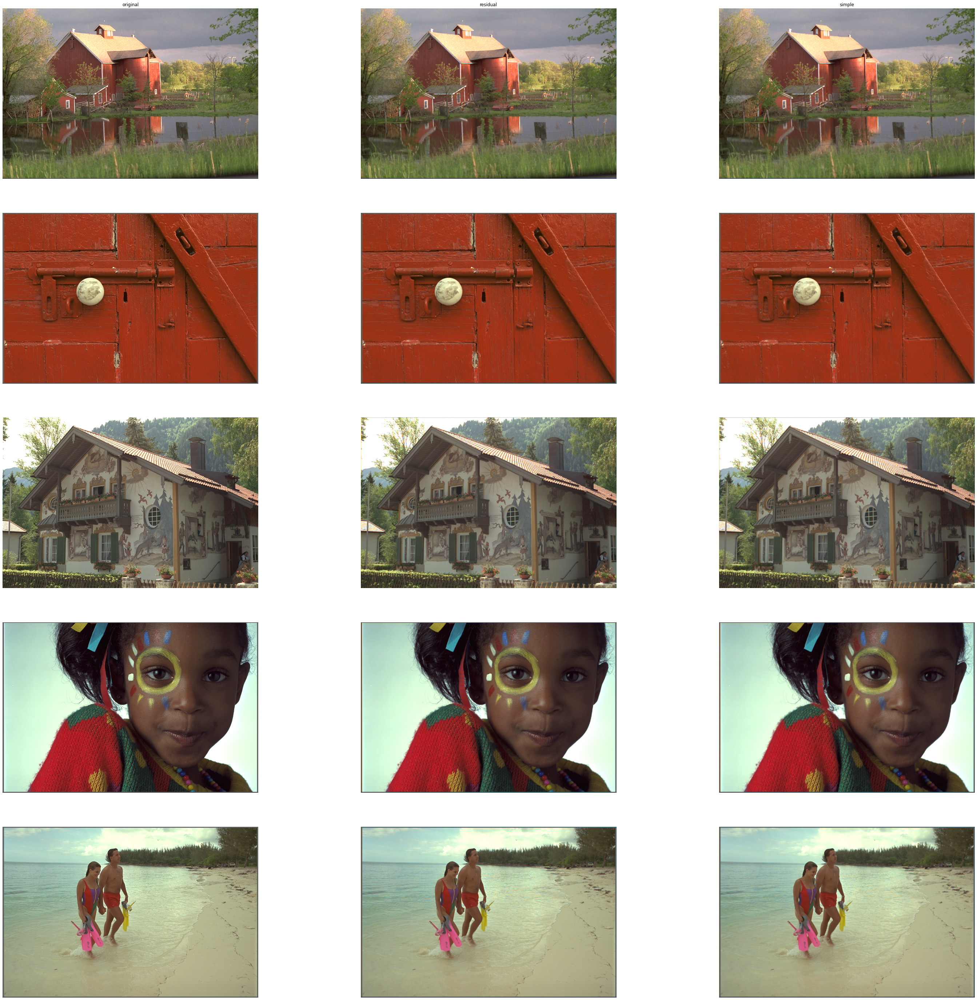

In [3]:
fig = plt.figure(figsize=(50, 50))

j = 1

for i, img in enumerate(img_samples["original"]):
    ax = fig.add_subplot(5, 3, j)
    plt.imshow(img.astype(int))
    if j == 1:
        plt.title("original")
    plt.axis('off')
    
    fig.add_subplot(5, 3, j + 1, sharex = ax)
    plt.imshow(img_samples["ri"][i].astype(int))
    if j == 1:
        plt.title("residual")
    plt.axis('off')
    
    fig.add_subplot(5, 3, j + 2)
    plt.imshow(img_samples["simple"][i].astype(int))
    if j == 1:
        plt.title("simple")
    plt.axis('off')
    j += 3
plt.show()

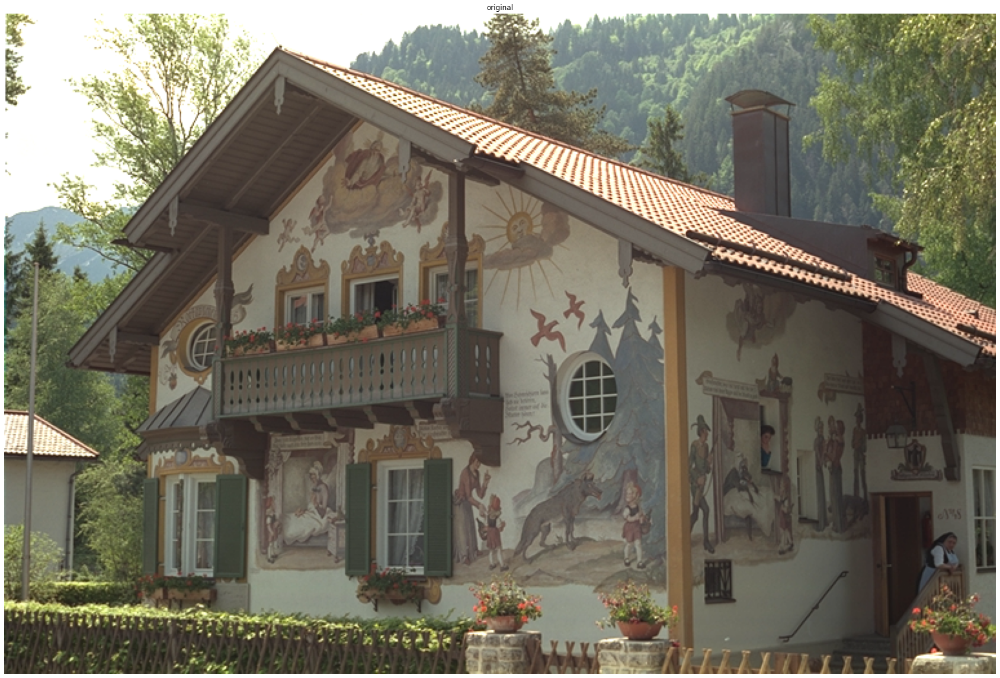

In [4]:
fig = plt.figure(figsize=(30, 30))
plt.imshow(img_samples["original"][2].astype(int))
plt.axis('off')
plt.title("original")
plt.show()

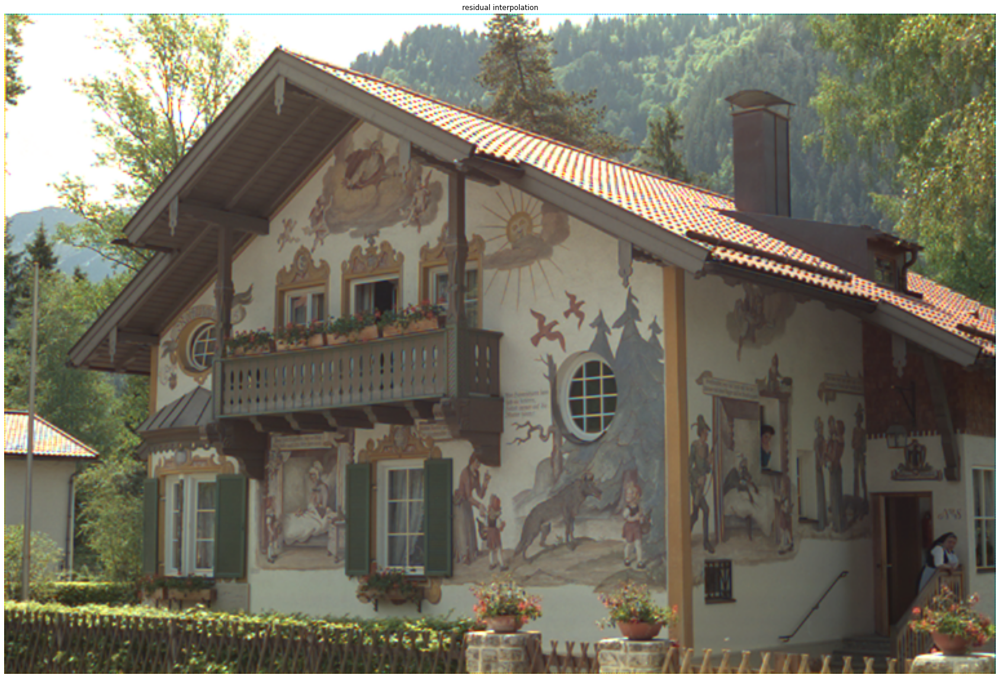

In [5]:
fig = plt.figure(figsize=(30, 30))
plt.imshow(img_samples["ri"][2].astype(int))
plt.axis('off')
plt.title("residual interpolation")
plt.show()

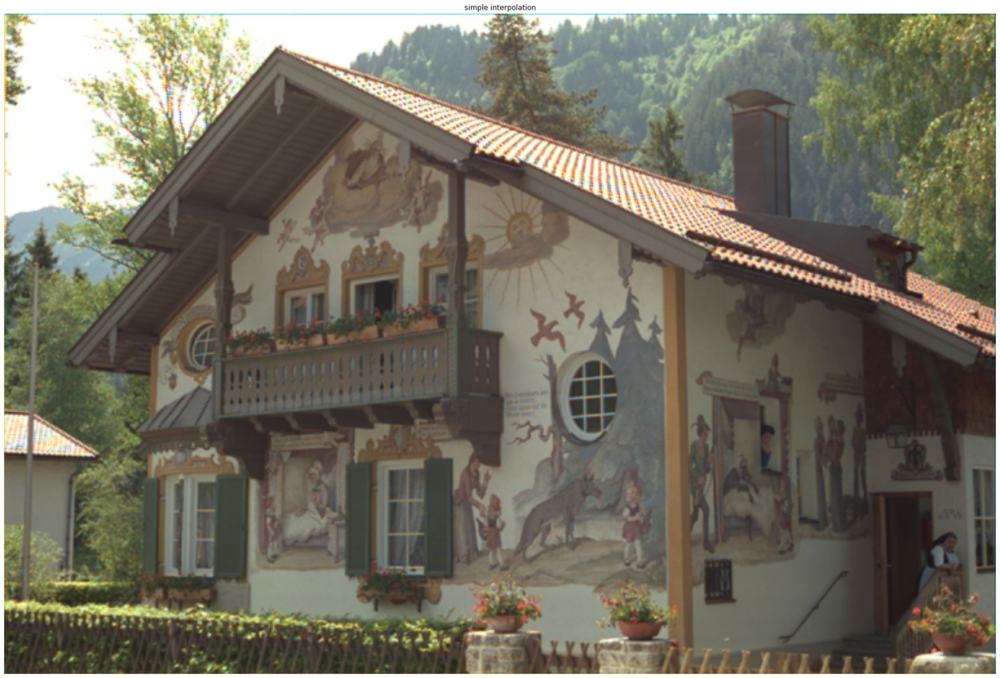

In [6]:
fig = plt.figure(figsize=(30, 30))
plt.imshow(img_samples["simple"][2].astype(int))
plt.axis('off')
plt.title("simple interpolation")
plt.show()